# Sensors, Perception and Actuation
## Assignment - 5


### Github Link: https://github.com/syedjameel/SPA-Assignment-5.git

Student : Jameel Ahmed Syed
email : j.syed@innopolis.university

# Camera calibration

### Task 1
- Take/print a chessboard and record a dataset with some photos of different positions relatively to a camera (a camera with switched off auto-focusing mode); Calibrate the camera using Numpy and OpenCV and store the intrinsic and extrinsic parameters

### Task 2
- Place a round flat object (e.g. a coin/ a card/ a magnet) on the checkerboard, take a photo and use filters and edge detectors (Canny/Sobel, blurring, dilatation and erosion) to get the clear object’s boundaries. Estimate the object’s dimensions, and check it by a ruler. Compute the distance between the camera plane and the selected object.




### Note: Reference taken from
1. Lab-5
2. https://pyimagesearch.com/2015/01/19/find-distance-camera-objectmarker-using-python-opencv/
3. https://pyimagesearch.com/2016/03/28/measuring-size-of-objects-in-an-image-with-opencv/

# Task - 1


### 1. Import All the Necessary Libraries


In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from glob import glob
from scipy.spatial import distance as dist
from imutils import perspective
from imutils import contours
import argparse
import imutils
from imutils import paths

In [4]:
# Initializing the variables
square_size = 8    # in milli-meter
img_mask = "new_imgs/*.jpg"  # Path to the images
pattern_size = (7, 7)     # Total Number of squares in rows and columns
figsize = (20, 80)      # Plot figure size

In [5]:

img_names = glob(img_mask)
num_images = len(img_names)

pattern_points = np.zeros((np.prod(pattern_size), 3), np.float32)
pattern_points[:, :2] = np.indices(pattern_size).T.reshape(-1, 2)
pattern_points *= square_size
obj_points = []
img_points = []
h, w = cv2.imread(img_names[0]).shape[:2]



In [6]:
print(f"Image size (Height*Width) = ({h}*{w})")

Image size (Height*Width) = (1280*578)


## Step 1: find all corners in calibration plane


processing new_imgs/photo_2022-12-08_17-42-29.jpg... 


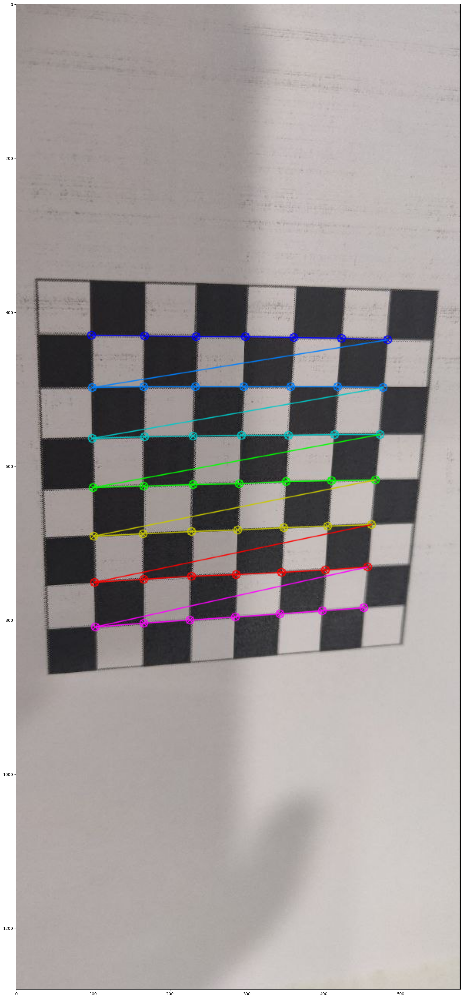

new_imgs/photo_2022-12-08_17-42-29.jpg... OK
processing new_imgs/photo_2022-12-08_17-42-11.jpg... 


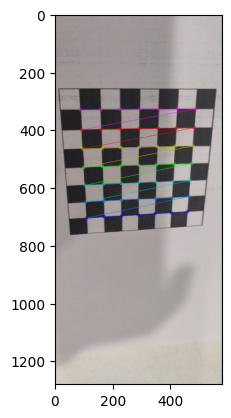

new_imgs/photo_2022-12-08_17-42-11.jpg... OK
processing new_imgs/photo_2022-12-08_17-42-24.jpg... 
chessboard not found
processing new_imgs/photo_2022-12-08_17-42-33.jpg... 


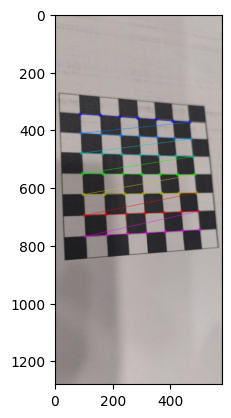

new_imgs/photo_2022-12-08_17-42-33.jpg... OK
processing new_imgs/photo_2022-12-08_17-40-16.jpg... 


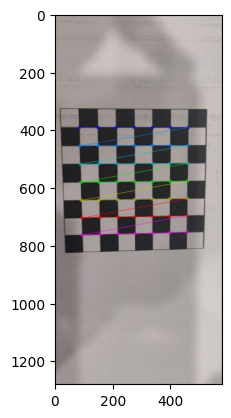

new_imgs/photo_2022-12-08_17-40-16.jpg... OK
processing new_imgs/photo_2022-12-08_17-42-38.jpg... 


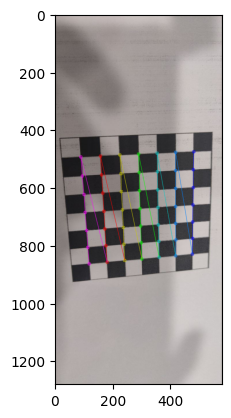

new_imgs/photo_2022-12-08_17-42-38.jpg... OK
processing new_imgs/photo_2022-12-08_17-42-18.jpg... 
chessboard not found


In [7]:
plt.figure(figsize=figsize)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

for i, fn in enumerate(img_names):
    print("processing %s... " % fn)
    imgBGR = cv2.imread(fn)

    if imgBGR is None:
        print("Failed to load", fn)
        continue

    imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(imgRGB, cv2.COLOR_BGR2GRAY)

    # Finds the positions of internal corners of the chessboard.
    # image	Source chessboard view. It must be an 8-bit grayscale or color image.
    # patternSize	Number of inner corners per a chessboard row and column.
    # corners	Output array of detected corners.

    found, corners = cv2.findChessboardCorners(img, pattern_size)

    if not found:
        print("chessboard not found")
        continue
    # refining pixel coordinates for given 2d points.
    corners2 = cv2.cornerSubPix(img, corners, (5,5),(-1,-1), criteria)
      

    # Draw and display the corners  

    img_w_corners = cv2.drawChessboardCorners(imgRGB, pattern_size, corners2, found)
    plt.plot()
    plt.imshow(img_w_corners)
    plt.show()

    print(f"{fn}... OK")
    img_points.append(corners2)
    obj_points.append(pattern_points)






## Step 2: Get camera Intrinsics + Extrinsic + distortion coeffs
also get extrinsic rotation and translation vectors per image. Rotation vector is another representation for a full R matrix
more on it here: https://en.wikipedia.org/wiki/Rodrigues%27_rotation_formula


In [8]:
# calculate camera distortion
rms, camera_matrix, dist_coefs, _rvecs, _tvecs = cv2.calibrateCamera(obj_points, img_points, (w, h), None, None)

print("\nRMS:", rms)
print("camera matrix:\n", camera_matrix)
print("distortion coefficients: ", dist_coefs.ravel())




RMS: 0.7282826418501669
camera matrix:
 [[1.07326860e+03 0.00000000e+00 3.02068824e+02]
 [0.00000000e+00 1.06509239e+03 6.82828375e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
distortion coefficients:  [ 1.78357552e-01 -2.91803691e+00  5.63171333e-03  8.09009508e-03
  1.11263929e+01]


In [9]:
print(_rvecs)

(array([[ 0.30299705],
       [-0.26149807],
       [-0.0020529 ]]), array([[-0.27867913],
       [-0.63049705],
       [ 3.04192027]]), array([[-0.12134677],
       [-0.35268612],
       [-0.05368399]]), array([[ 0.14309656],
       [-0.09702605],
       [-0.01303829]]), array([[ 0.0766305 ],
       [-0.327484  ],
       [ 1.50675716]]))


In [10]:
mean_error = 0
for i in range(len(obj_points)):
    imgpoints2 = cv2.projectPoints(obj_points[i],  _rvecs[i], _tvecs[i], camera_matrix, dist_coefs)[0]
    error = cv2.norm(img_points[i].reshape(-1,1,2), imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    mean_error += error


print( "total error: {}".format(mean_error/len(obj_points)) )

total error: 0.1037198197487073


## Step 3: Build undistorted images


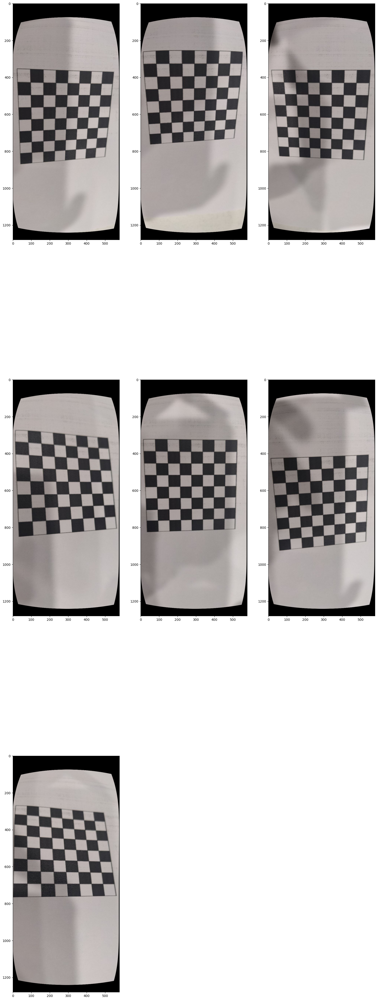

Done


In [11]:
# undistort the image with the calibration
plt.figure(figsize=figsize)
for i, fn in enumerate(img_names):

    imgBGR = cv2.imread(fn)
    imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)

    dst = cv2.undistort(imgRGB, camera_matrix, dist_coefs)

    if i < 12:
        plt.subplot(4, 3, i + 1)
        plt.imshow(dst)

plt.show()
print("Done")



## Example for full projection from 3D to 2D of a rectangle


/tmp/ipykernel_6526/1256087546.py:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  objectPoints =(square_size* np.array([[0, 0, 0], [0, 1, 0], [2, 1, 0], [2, 0, 0], [0, 0, -0.4], [0, 1, -0.4], [2, 1, -0.4], [2, 0, -0.4]], dtype=np.float))


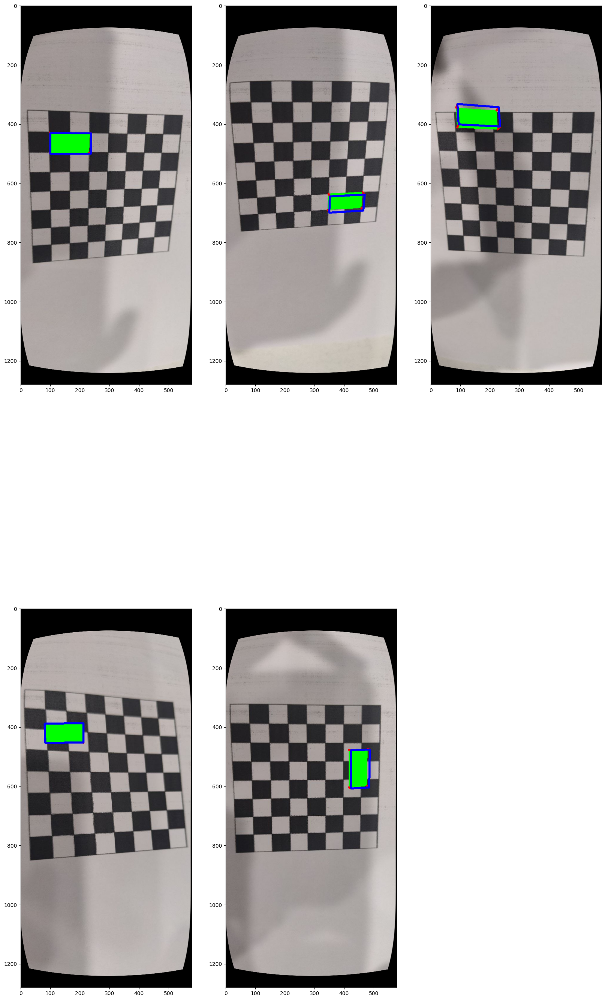

In [12]:
objectPoints =(square_size* np.array([[0, 0, 0], [0, 1, 0], [2, 1, 0], [2, 0, 0], [0, 0, -0.4], [0, 1, -0.4], [2, 1, -0.4], [2, 0, -0.4]], dtype=np.float))

def draw(img, imgpts):
    imgpts = np.int32(imgpts).reshape(-1, 2)

    # draw ground floor in green
    img = cv2.drawContours(img, [imgpts[:4]], -1, (0, 255, 0), -1)

    # draw pillars in blue color
    for i, j in zip(range(4), range(4, 8)):
        img = cv2.line(img, tuple(imgpts[i]), tuple(imgpts[j]), (255), 5)

    # draw top layer in red color
    img = cv2.drawContours(img, [imgpts[4:]], -1, (0, 0, 255), 5)

    return img


plt.figure(figsize=figsize)
for i in range(min(len(img_names),len(_rvecs))):

    imgBGR = cv2.imread(img_names[i])
    imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)

    dst = cv2.undistort(imgRGB, camera_matrix, dist_coefs)
    imgpts = cv2.projectPoints(objectPoints, _rvecs[i], _tvecs[i], camera_matrix, dist_coefs)[0]
    drawn_image = draw(dst, imgpts)

# Plotting 
    if i < 12:
        plt.subplot(4, 3, i + 1)
        plt.imshow(drawn_image)

plt.show()


# Task-2

### Place a round flat object (e.g. a coin/ a card/ a magnet) on the checkerboard, take a photo and use filters and edge detectors (Canny/Sobel, blurring, dilatation and erosion) to get the clear object’s boundaries. Estimate the object’s dimensions, and check it by a ruler. Compute the distance between the camera plane and the selected object.

### Step 1: Coin edge detection with Canny edge detection

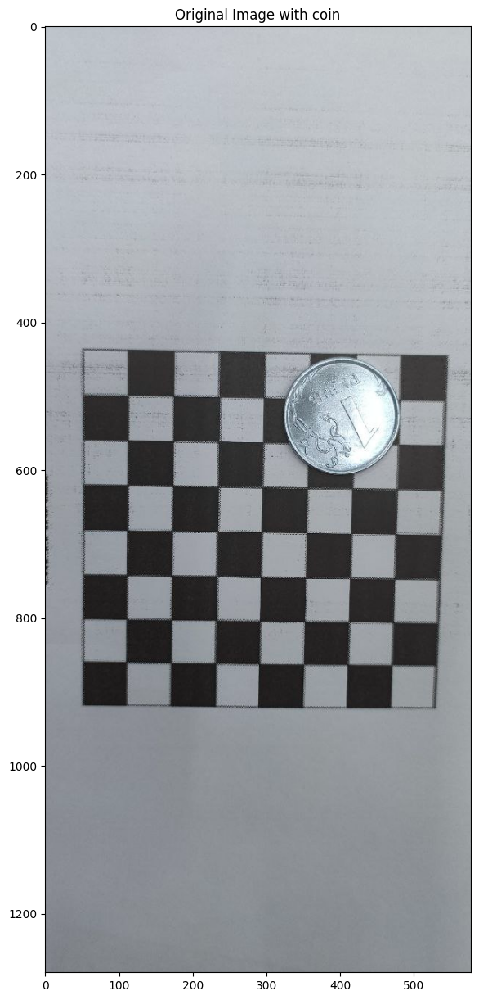

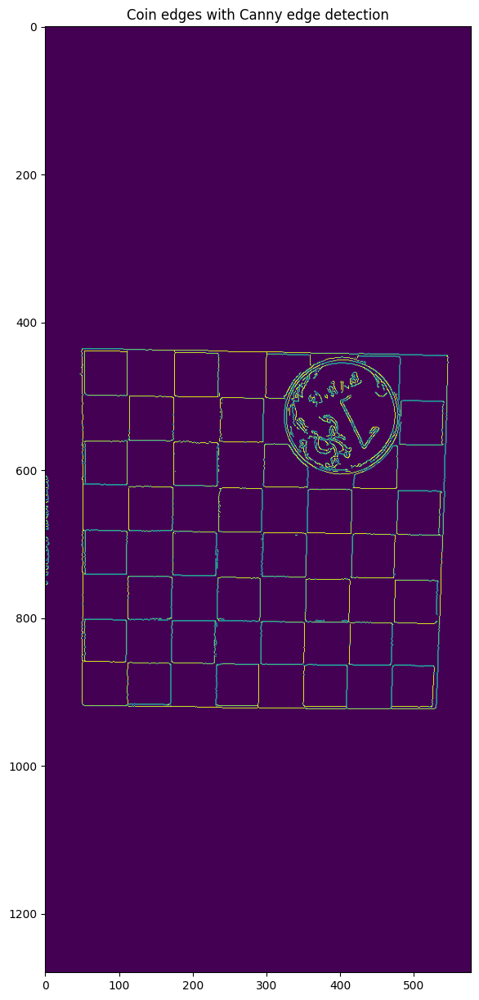

In [13]:
# Read the original image
img = cv2.imread('photo_2022-12-08_17-45-40.jpg')

# Convert to graycsale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Blur the image for better edge detection
img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)

# Canny Edge Detection
edges = cv2.Canny(image=img_blur, threshold1=100, threshold2=200) # Canny Edge Detection


# Display Canny Edge Detection Image

plt.figure(figsize=(10, 15))
plt.title("Original Image with coin")
plt.imshow(img)
plt.show()


plt.figure(figsize=(10, 15))
plt.title("Coin edges with Canny edge detection")
plt.imshow(edges)
plt.show()


### Step 2: Coin Dimensions Detection

In [14]:

# find contours in the edge map
cnts = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL,
	cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

# sort the contours from left-to-right and initialize the
# 'pixels per metric' calibration variable
(cnts, _) = contours.sort_contours(cnts)
pixelsPerMetric = None

In [15]:
def midpoint(ptA, ptB):
	return ((ptA[0] + ptB[0]) * 0.5, (ptA[1] + ptB[1]) * 0.5)

# construct the argument parse and parse the arguments
ap = argparse.ArgumentParser()
ap.add_argument("-i", "--image", required=True, help="path to the input image")
ap.add_argument("-w", "--width", type=float, required=True, help="width of the left-most object in the image (in inches)")
args = {}
args["width"] = 2.5

In [16]:
# loop over the contours individually
for c in cnts:
	# if the contour is not sufficiently large, ignore it
	if cv2.contourArea(c) < 100:
		continue
	# compute the rotated bounding box of the contour
	orig = img.copy()
	box = cv2.minAreaRect(c)
	box = cv2.cv.BoxPoints(box) if imutils.is_cv2() else cv2.boxPoints(box)
	box = np.array(box, dtype="int")

	# order the points in the contour such that they appear
	# in top-left, top-right, bottom-right, and bottom-left
	# order, then draw the outline of the rotated bounding
	# box
	box = perspective.order_points(box)
	cv2.drawContours(orig, [box.astype("int")], -1, (0, 255, 0), 2)
	# loop over the original points and draw them
	for (x, y) in box:
		cv2.circle(orig, (int(x), int(y)), 5, (0, 0, 255), -1)

        # unpack the ordered bounding box, then compute the midpoint
	# between the top-left and top-right coordinates, followed by
	# the midpoint between bottom-left and bottom-right coordinates
	(tl, tr, br, bl) = box
	(tltrX, tltrY) = midpoint(tl, tr)
	(blbrX, blbrY) = midpoint(bl, br)
	# compute the midpoint between the top-left and top-right points,
	# followed by the midpoint between the top-righ and bottom-right
	(tlblX, tlblY) = midpoint(tl, bl)
	(trbrX, trbrY) = midpoint(tr, br)
	# draw the midpoints on the image
	cv2.circle(orig, (int(tltrX), int(tltrY)), 5, (255, 0, 0), -1)
	cv2.circle(orig, (int(blbrX), int(blbrY)), 5, (255, 0, 0), -1)
	cv2.circle(orig, (int(tlblX), int(tlblY)), 5, (255, 0, 0), -1)
	cv2.circle(orig, (int(trbrX), int(trbrY)), 5, (255, 0, 0), -1)
	# draw lines between the midpoints
	cv2.line(orig, (int(tltrX), int(tltrY)), (int(blbrX), int(blbrY)),
		(255, 0, 255), 2)
	cv2.line(orig, (int(tlblX), int(tlblY)), (int(trbrX), int(trbrY)),
		(255, 0, 255), 2)

    	# compute the Euclidean distance between the midpoints
	dA = dist.euclidean((tltrX, tltrY), (blbrX, blbrY))
	dB = dist.euclidean((tlblX, tlblY), (trbrX, trbrY))

	# if the pixels per metric has not been initialized, then
	# compute it as the ratio of pixels to supplied metric
	# (in this case, inches)
	if pixelsPerMetric is None:
		pixelsPerMetric = dB / args["width"]


    # compute the size of the object
	dimA = dA / pixelsPerMetric
	dimB = dB / pixelsPerMetric
	# draw the object sizes on the image
	cv2.putText(orig, "{:.1f}in".format(dimA),
		(int(tltrX - 15), int(tltrY - 10)), cv2.FONT_HERSHEY_SIMPLEX,
		0.65, (255, 255, 255), 2)
	img = cv2.putText(orig, "{:.1f}in".format(dimB),
		(int(trbrX + 10), int(trbrY)), cv2.FONT_HERSHEY_SIMPLEX, 0.65, (255, 255, 255), 2)

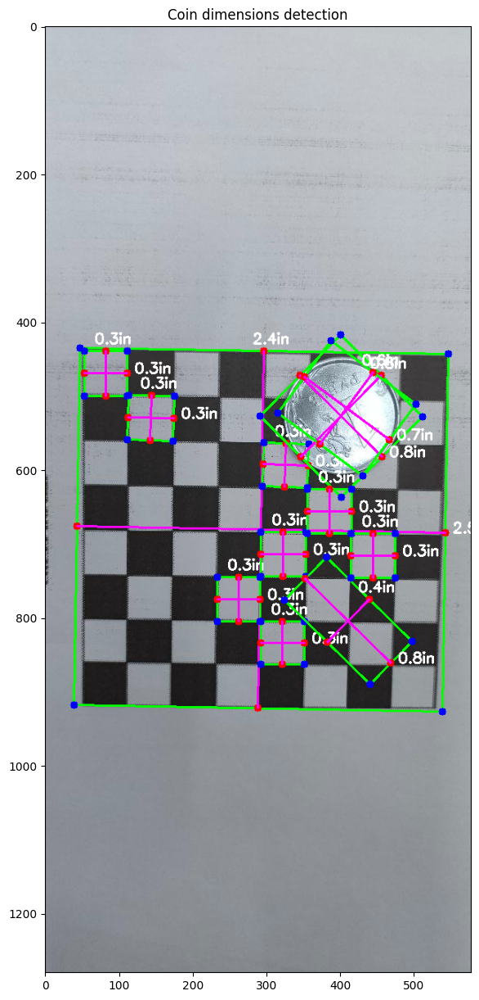

In [17]:
plt.figure(figsize=(10, 15))
plt.title("Coin dimensions detection")
plt.imshow(img)
plt.show()

### As detected The coin is 0.8 inches which is 20mm in diameter. Its accurate.

### Step 3: Distance between the camera and the object detection

In [18]:
def find_marker(image):
	# convert the image to grayscale, blur it, and detect edges
	gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
	gray = cv2.GaussianBlur(gray, (5, 5), 0)
	edged = cv2.Canny(gray, 35, 125)
	# find the contours in the edged image and keep the largest one;
	# we'll assume that this is our piece of paper in the image
	cnts = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
	cnts = imutils.grab_contours(cnts)
	c = max(cnts, key = cv2.contourArea)
	# compute the bounding box of the of the paper region and return it
	return cv2.minAreaRect(c)

def distance_to_camera(knownWidth, focalLength, perWidth):
	# compute and return the distance from the maker to the camera
	return (knownWidth * focalLength) / perWidth



In [19]:


# initialize the known distance from the camera to the object, which
# in this case is 24 inches
KNOWN_DISTANCE = 5
# initialize the known object width, which in this case, the piece of
# paper is 12 inches wide
KNOWN_WIDTH = 2.5
# load the furst image that contains an object that is KNOWN TO BE 2 feet
# from our camera, then find the paper marker in the image, and initialize
# the focal length
image = cv2.imread("photo_2022-12-08_17-45-40.jpg")
marker = find_marker(image)
focalLength = (marker[1][0] * KNOWN_DISTANCE) / KNOWN_WIDTH


# loop over the images
i = 0
img = []
for imagePath in sorted(paths.list_images("coin_imgs")):
	# load the image, find the marker in the image, then compute the
	# distance to the marker from the camera
	image = cv2.imread(imagePath)
	marker = find_marker(image)
	inches = distance_to_camera(KNOWN_WIDTH, focalLength, marker[1][0])
	# draw a bounding box around the image and display it
	box = cv2.cv.BoxPoints(marker) if imutils.is_cv2() else cv2.boxPoints(marker)
	box = np.int0(box)
	cv2.drawContours(image, [box], -1, (0, 255, 0), 2)
	img.append(cv2.putText(image, "%.2fft" % (inches / 12),
		(image.shape[1] - 200, image.shape[0] - 20), cv2.FONT_HERSHEY_SIMPLEX,
		2.0, (0, 255, 0), 3))


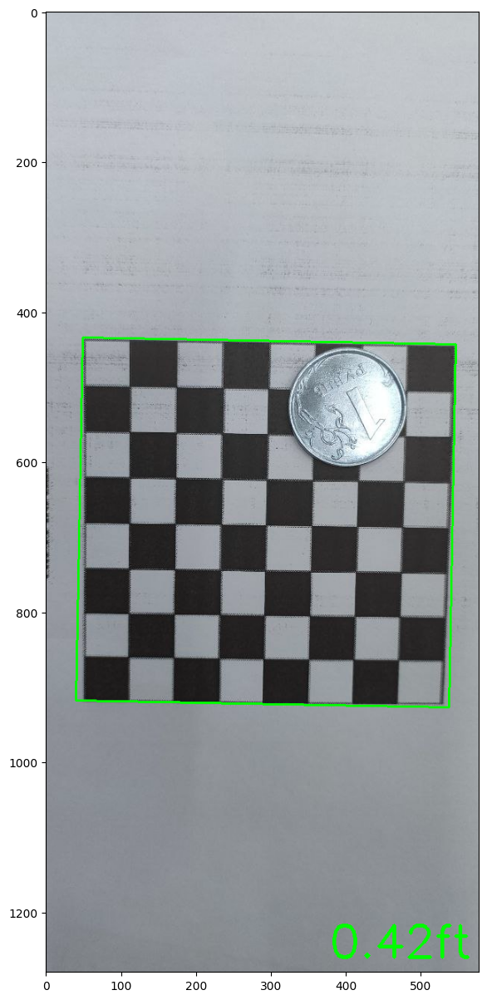

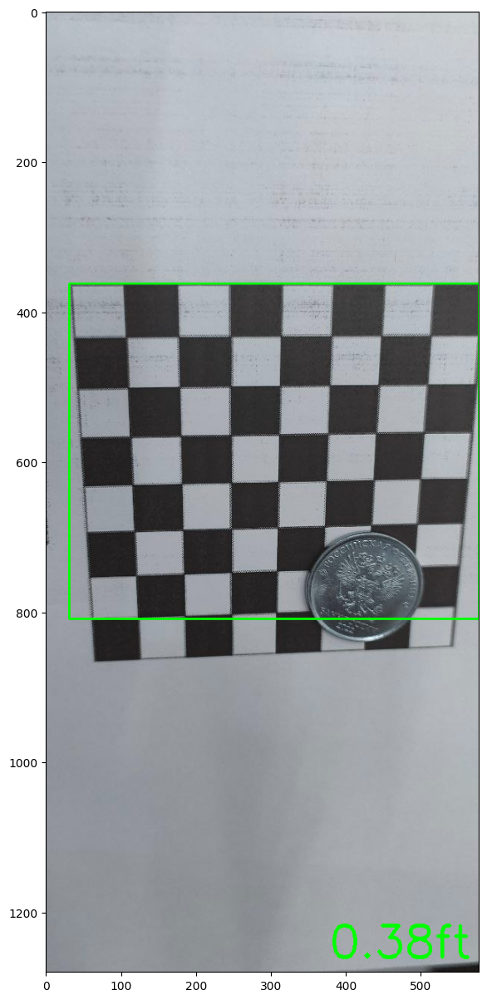

In [20]:
plt.figure(figsize=(10, 15))
plt.imshow(img[0])
plt.figure(figsize=(10, 15))
plt.imshow(img[2])
plt.show()

### As detected the photo was taken from about 0.4 ft from the object to the camera

### Note: Reference taken from
1. Lab-5
2. https://pyimagesearch.com/2015/01/19/find-distance-camera-objectmarker-using-python-opencv/
3. https://pyimagesearch.com/2016/03/28/measuring-size-of-objects-in-an-image-with-opencv/